In [1]:
import numpy as np
import pandas as pd
import json
import os
from neo4j import GraphDatabase
import cv2
from ultralytics import YOLO
from glob import glob
import ast

In [2]:
URI = "neo4j://localhost:7687"  
USERNAME = "neo4j"            
PASSWORD = "Tai123321"     
model = YOLO('yolov8x-oiv7.pt') 

In [3]:
ground_truth = pd.read_csv("ground_truth.csv")
object_detection = pd.read_csv("./objects_extract_fixed.csv")
parent_map = pd.read_csv("parent_map.csv")
child_map = pd.read_csv("child_map.csv")  

In [4]:
print(ground_truth.head())

            ImageID                                        Description
0  0000253ea4ecbf19  ['Carnivore', 'Human leg', 'Mammal', 'Plant', ...
1  0000286a5c6a3eb5  ['Human eye', 'Sunglasses', 'Shorts', 'Person'...
2  00003bfccf5f36c2  ['Person', 'Lantern', 'Chair', 'Table', 'Tree'...
3  000045257f66b9e2  ['Boy', 'Person', 'Cowboy hat', 'Hat', 'Fedora...
4  0000530c47410921          ['Toy', 'Bird', 'Duck', 'Tire', 'Animal']


In [5]:
object_detection["Description"] = object_detection["Description"].apply(lambda x: ast.literal_eval(x))
print(object_detection.head())

            ImageID                                        Description
0  00408efc3cabdc4e  [Food, Fast food, Waffle, Pancake, Burrito, Sn...
1  0059eb01bba96297  [Food, Fast food, Waffle, Pancake, Burrito, Sn...
2  0055444dd2ab3489                    [Person, Man, Woman, Boy, Girl]
3  0028e126ab55ebfc  [Land vehicle, Person, Furniture, Clothing, Am...
4  00336bd08f30f7f0  [Person, Human body, Clothing, Man, Woman, Boy...


In [6]:
child_map["Child"] = child_map["Child"].apply(lambda x: ast.literal_eval(x))
print(child_map.head())

        Parent                                              Child
0     Aircraft                     [Helicopter, Airplane, Rocket]
1       Animal  [Shellfish, Bird, Invertebrate, Mammal, Reptil...
2    Auto part  [Vehicle registration plate, Wheel, Seat belt,...
3  Baked goods    [Pretzel, Cookie, Muffin, Bagel, Bread, Pastry]
4         Ball  [Football, Cricket ball, Volleyball (Ball), Te...


In [7]:
ground_truth["Description"] = ground_truth["Description"].apply(lambda x: ast.literal_eval(x))
print(ground_truth.head())

            ImageID                                        Description
0  0000253ea4ecbf19  [Carnivore, Human leg, Mammal, Plant, Tree, Hu...
1  0000286a5c6a3eb5  [Human eye, Sunglasses, Shorts, Person, Human ...
2  00003bfccf5f36c2  [Person, Lantern, Chair, Table, Tree, Furnitur...
3  000045257f66b9e2  [Boy, Person, Cowboy hat, Hat, Fedora, Human b...
4  0000530c47410921                    [Toy, Bird, Duck, Tire, Animal]


In [8]:
print(ground_truth.shape)

(97273, 2)


In [9]:
def get_neo4j_driver():
    return GraphDatabase.driver(URI, auth=(USERNAME, PASSWORD))

In [10]:
def query_images_any(sorted_classes):
    image_ids = []
    with get_neo4j_driver().session() as session:
                query = """
                    WITH $classes AS classes
                    MATCH (img:Image)
                    WHERE ANY(class IN classes WHERE class IN[(img)-[:HAS_A]->(cls:Class) | cls.name])
                    RETURN img.image_Id AS image_id
                """
                result = session.run(query, classes=list(sorted_classes))
                for record in result:
                    if record["image_id"] not in image_ids:
                        image_ids.append(record["image_id"])
    if image_ids:
        return image_ids
    else:
        return None

In [11]:
from sklearn.metrics.pairwise import euclidean_distances
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.preprocessing import normalize 

In [24]:
def get_vector(cv2_img, bins=32):
    red = cv2.calcHist(
        [cv2_img], [2], None, [bins], [0, 256]
    )
    green = cv2.calcHist(
        [cv2_img], [1], None, [bins], [0, 256]
    )
    blue = cv2.calcHist(
        [cv2_img], [0], None, [bins], [0, 256]
    )
    vector = np.concatenate([red, green, blue], axis=0)
    vector = vector.reshape(-1)
    return vector

def dict_to_vector(hist_list):
    red = np.array(hist_list["R"], dtype=float)
    green = np.array(hist_list["G"], dtype=float)
    blue = np.array(hist_list["B"], dtype=float)
    vector = np.concatenate([red, green, blue], axis=0)
    vector = vector.reshape(-1)
    return vector

def cosine(a,b):
    return np.dot(a, b) / (np.linalg.norm(a) * np.linalg.norm(b))

def caculate_similarity(query_image, dataset_images):
    query_hist_vector = get_vector(query_image)
    similarity = []

    for hist in dataset_images:
        id = hist["ID"]
        histogram = hist["Histogram"]
        distance = cosine_similarity([query_hist_vector], [histogram]) 
        euclid = euclidean_distances(query_hist_vector.reshape(1, -1), histogram.reshape(1, -1))[0][0]
        reversed_euclid = 1 / (1 + euclid)
        similarity.append({
            "ID" : id,
            "Similarity" : reversed_euclid
            
        })
    
    similarity.sort(key=lambda x: x["Similarity"], reverse=True)

    return similarity

def search_hist_from_ids(ids, dataset_hist):
    result = []
    for data in dataset_hist:
        if data["ID"] in ids:
            result.append(data)
        if len(result) == len(ids):
            break
    return result

In [13]:
with open("../bowv/img_hist.json") as f:
    img_json = json.load(f)
dataset_hist = []
for data in img_json:
    dataset_hist.append({
        "ID": data["ID"],
        "Histogram": dict_to_vector(data["Histogram"])
    })

In [25]:
test_path = glob("../open_images_classes_1/Person/images/val/*.jpg")
test_query = query_images_any(["Person"])
test_dataset = search_hist_from_ids(test_query, dataset_hist)
test_ids = caculate_similarity(cv2.imread(test_path[0]), test_dataset)
test_ids1 = caculate_similarity(cv2.imread(test_path[1]), test_dataset)
print(test_ids)
print(test_ids1)

[{'ID': 'f4355e8f42a89272', 'Similarity': 1.2097550575828385e-05}, {'ID': '8fb7a74cb58c46e7', 'Similarity': 1.2085033840098352e-05}, {'ID': '6ebe58aff793fb80', 'Similarity': 1.140252577531906e-05}, {'ID': '861e898a27192dd6', 'Similarity': 1.1222604738868886e-05}, {'ID': 'f5d1195d1392c958', 'Similarity': 1.1185672843898174e-05}, {'ID': '4ea605036a67f4c7', 'Similarity': 1.0871948568483913e-05}, {'ID': '646abae266480738', 'Similarity': 1.0605403297183197e-05}, {'ID': '332270f14ee60952', 'Similarity': 1.0407888673346217e-05}, {'ID': 'da2884c494c61abe', 'Similarity': 1.0379547301604341e-05}, {'ID': '3d5b70f49837d6fc', 'Similarity': 1.034899122704751e-05}, {'ID': '82a138bd00decec2', 'Similarity': 1.0341932947817956e-05}, {'ID': '0e400ba72405f3a9', 'Similarity': 1.0290283352083607e-05}, {'ID': '1edebe54a83c19b3', 'Similarity': 1.0216424094644126e-05}, {'ID': '14c74994146b1e9f', 'Similarity': 1.0208826666860814e-05}, {'ID': '0f94af5f8554c078', 'Similarity': 1.0168784236842865e-05}, {'ID': 'd59

In [15]:
def get_image_in_ground_truth(classes_list):
    image_ids = []
    for index, row in ground_truth.iterrows():
        for class_name in classes_list:
            if row["Description"].count(class_name) > 0:
                image_ids.append(row["ImageID"])
                break
    if image_ids:
        return image_ids
    else:
        return None

In [16]:
def check_image_in_ground_truth(image_id, the_ground_truth):
    for item in the_ground_truth:
        if item == image_id:
            return True
    return False

In [17]:
classes = ['Person', 'Clothing', 'Plant', 'Human body', 'Tree', 'Vehicle', 'Building', 'Land vehicle', 'Animal', 'Footwear']

In [18]:
def get_child_classes(cls):
    child_classes = []
    for index, row in child_map.iterrows():
        if row["Parent"] == cls:
            child_classes = row["Child"]
            break
    child_classes.append(cls)
    return child_classes

In [33]:
actual_ground_truth_len = len(ground_truth)
set_of_df = []
for cls in classes:
    child_cls_comb = get_child_classes(cls)
    ground_truth_images = get_image_in_ground_truth(child_cls_comb)
    query_images = query_images_any(child_cls_comb)
    imgs_path = glob(f"../open_images_classes_1/{cls}/images/val/*.jpg")
    df = pd.DataFrame(columns=['ImageID', 'Prediction', 'Score'])
    query_imgs_hist = search_hist_from_ids(query_images, dataset_hist)
    print(f"Class {cls}")
    print(len(imgs_path))
    i = 0
    for img_path in imgs_path:     
        img = cv2.imread(img_path)
        img_id = img_path.split("/")[-1].split(".")[0].split("\\")[-1]
        similarity = caculate_similarity(img, query_imgs_hist)[:1000]
        print(i)
        for sim in similarity:
            right = 0
            if check_image_in_ground_truth(sim["ID"], ground_truth_images):
                right = 1
            df.loc[len(df)] = [img_id, right, sim["Similarity"]]
            print(f"Image {img_id} - {right} - {sim['Similarity']}")
        if i == 10:
            break
        i += 1
    set_of_df.append(df)
    df.to_csv(f"./t3/{cls}_result.csv", index=False)
        

Class Person
100
0
Image 01ab773186c630c4 - 1 - 1.2640980034154086e-05
Image 01ab773186c630c4 - 1 - 1.2097550575828385e-05
Image 01ab773186c630c4 - 1 - 1.2085033840098352e-05
Image 01ab773186c630c4 - 1 - 1.1464686930716105e-05
Image 01ab773186c630c4 - 1 - 1.140252577531906e-05
Image 01ab773186c630c4 - 1 - 1.1384568619161103e-05
Image 01ab773186c630c4 - 1 - 1.1222604738868886e-05
Image 01ab773186c630c4 - 1 - 1.1185672843898174e-05
Image 01ab773186c630c4 - 1 - 1.0871948568483913e-05
Image 01ab773186c630c4 - 1 - 1.0859113403415433e-05
Image 01ab773186c630c4 - 1 - 1.0795266679322757e-05
Image 01ab773186c630c4 - 1 - 1.0663760633970752e-05
Image 01ab773186c630c4 - 1 - 1.062364170417738e-05
Image 01ab773186c630c4 - 1 - 1.0605403297183197e-05
Image 01ab773186c630c4 - 1 - 1.0495581832566354e-05
Image 01ab773186c630c4 - 1 - 1.041611314723845e-05
Image 01ab773186c630c4 - 1 - 1.0413565886716814e-05
Image 01ab773186c630c4 - 1 - 1.0407888673346217e-05
Image 01ab773186c630c4 - 1 - 1.0379547301604341e

In [19]:
from sklearn.metrics import auc, roc_curve

In [34]:
new_set_of_df = []
for cls in classes:
    df = pd.read_csv(f"./t3/{cls}_result.csv")
    new_set_of_df.append(df)

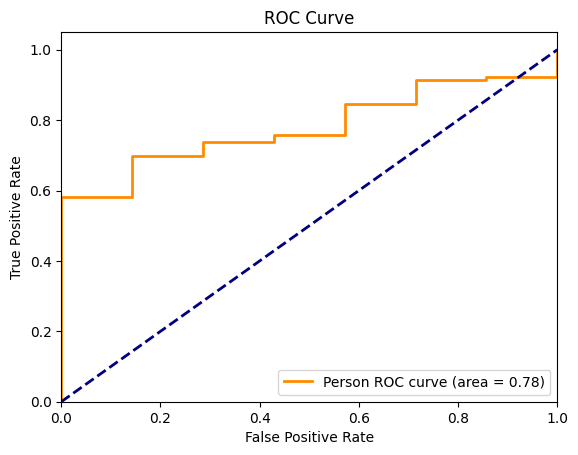

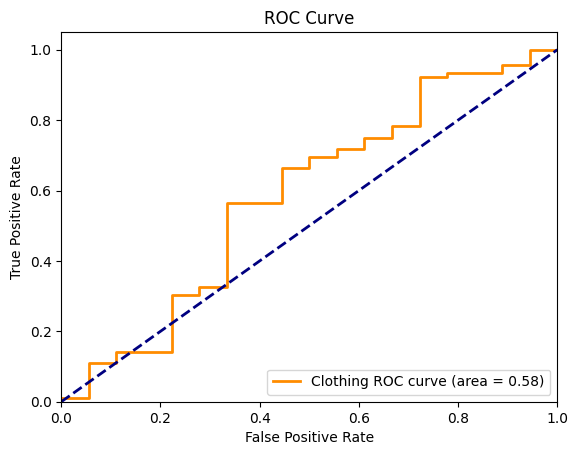

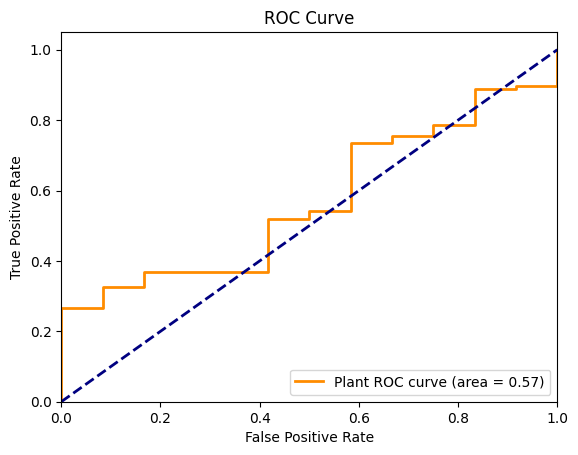

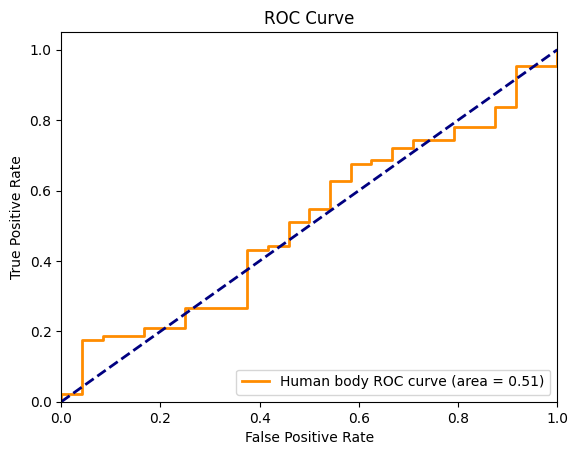

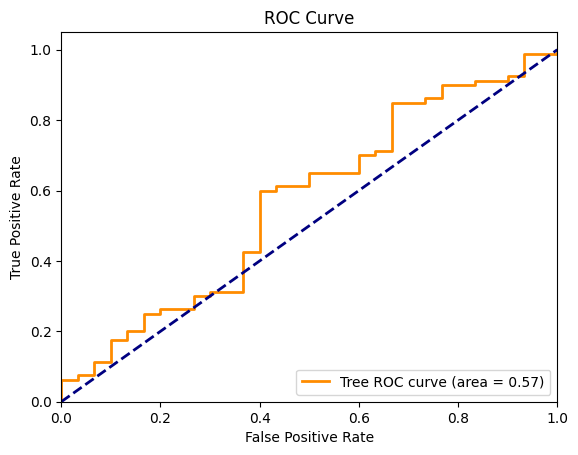

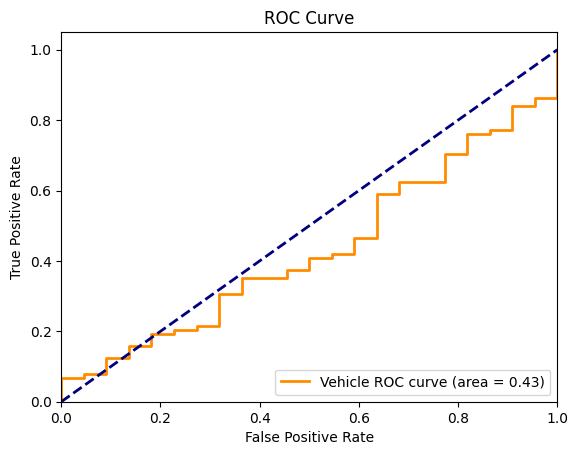

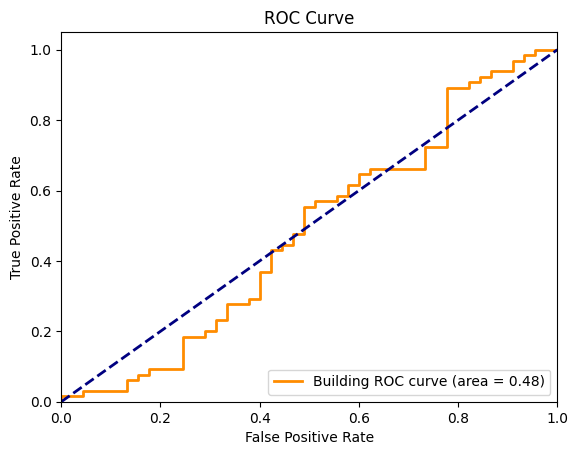

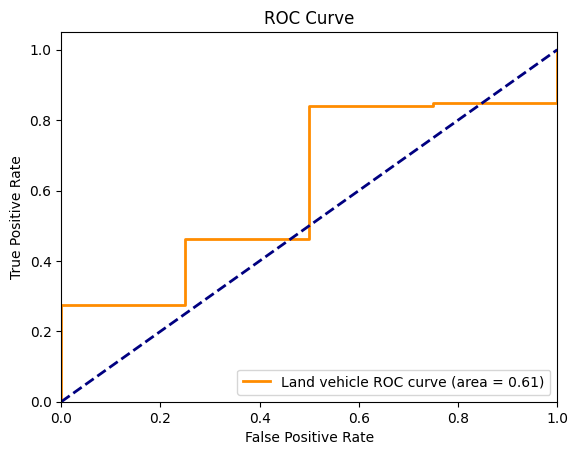

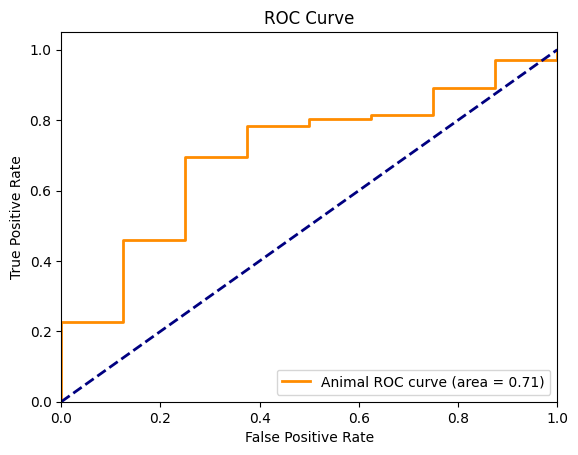

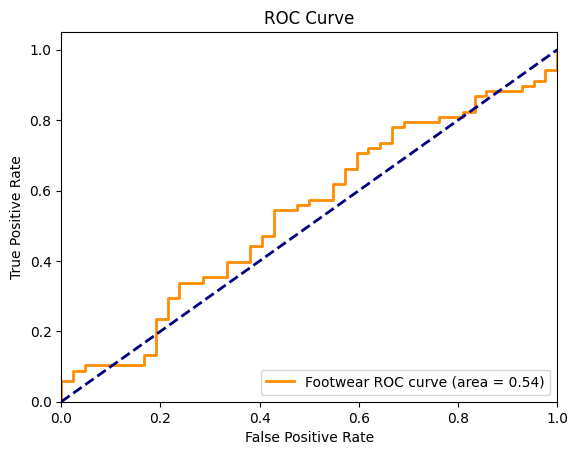

In [44]:
#draw roc curve based on recall@100 and fpr@100
from matplotlib import pyplot as plt
i = 0
new_set_of_df_1 = []
for cls in classes:
    df = pd.read_csv(f"./t2/{cls}_result.csv")
    new_set_of_df_1.append(df)
for df in new_set_of_df_1:
    fpr, tpr, _ = roc_curve(df['Prediction'], df['Score'])
    roc_auc = auc(fpr, tpr)
    plt.figure()
    lw = 2

    #add class label
    cls = classes[i]
    i += 1
    plt.plot(fpr, tpr, color='darkorange', lw=lw, label=cls + ' ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc="lower right")
    plt.show()

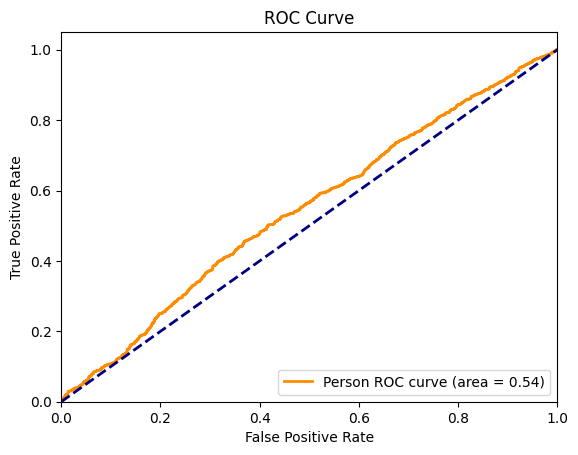

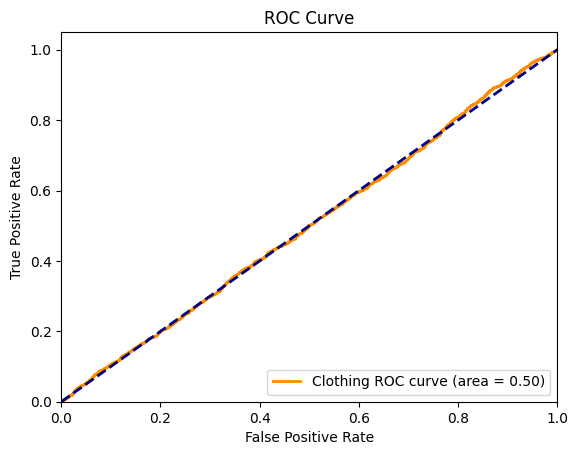

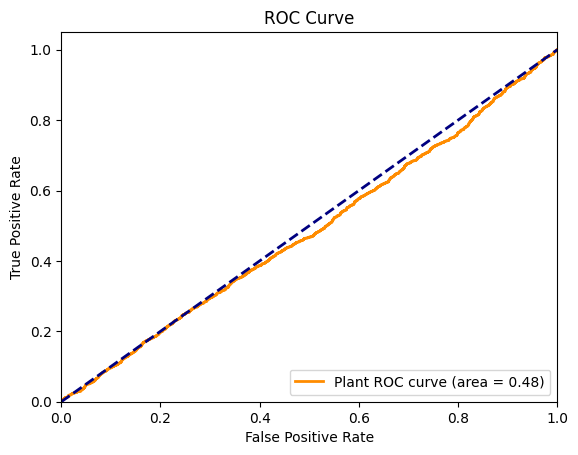

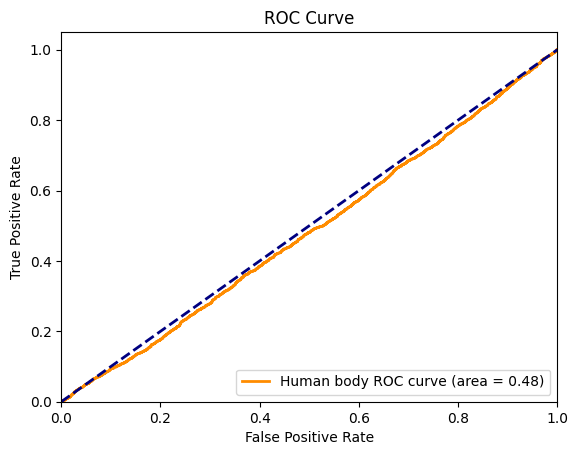

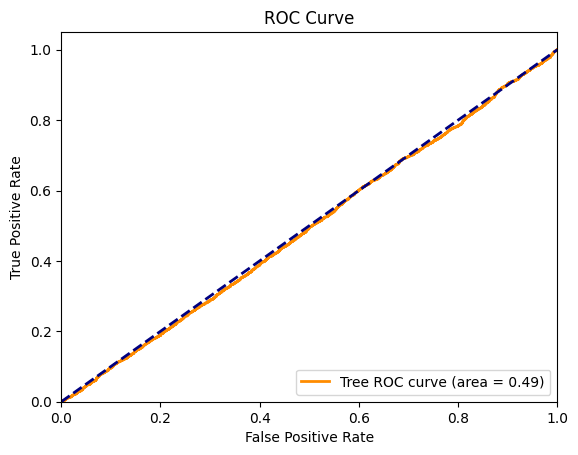

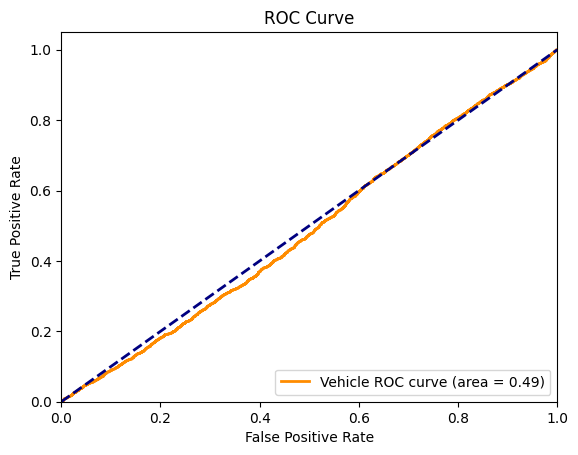

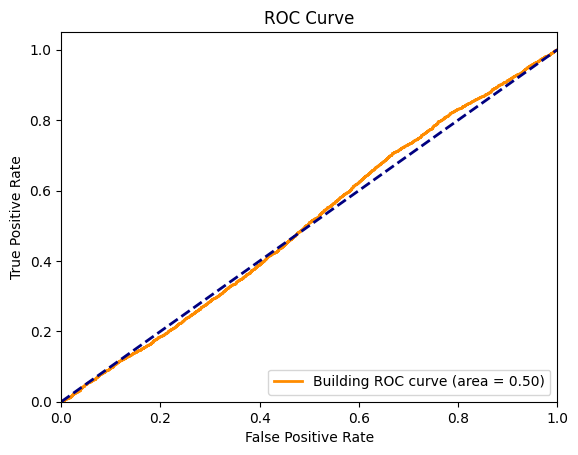

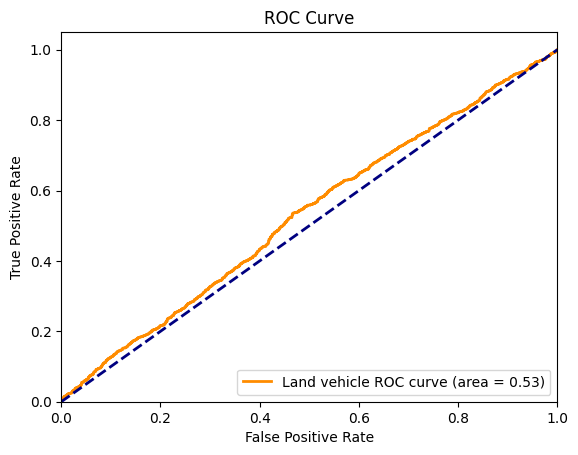

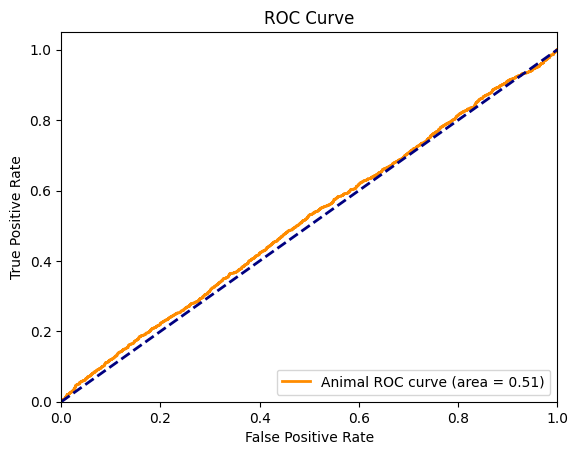

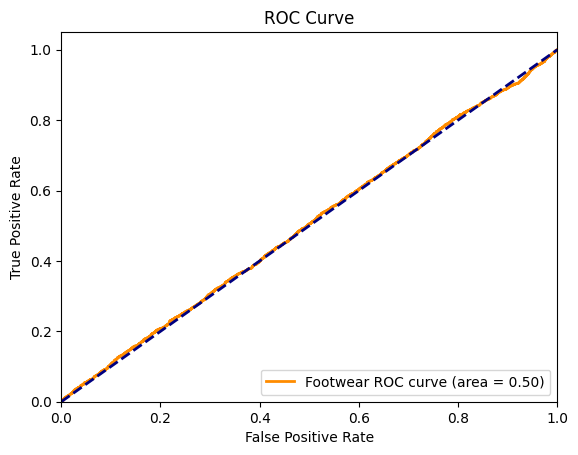

In [35]:
#draw roc curve based on recall@100 and fpr@100
from matplotlib import pyplot as plt
i = 0
for df in new_set_of_df:
    fpr, tpr, _ = roc_curve(df['Prediction'], df['Score'])
    roc_auc = auc(fpr, tpr)
    plt.figure()
    lw = 2

    #add class label
    cls = classes[i]
    i += 1
    plt.plot(fpr, tpr, color='darkorange', lw=lw, label=cls + ' ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc="lower right")
    plt.show()

             ImageID  Recall@1000  Precision@1000  FPR@1000
31  5278129f90393f7b     1.000000           0.957  0.000848
4   11596769ce629446     1.000000           0.957  0.000848
26  3feda4a7beb2af02     0.946809           0.952  0.000946
60  9981302a90bd62b1     0.936170           0.951  0.000966
21  2fcb6507cfc1fffb     0.936170           0.951  0.000966
             ImageID  Recall@1000  Precision@1000  FPR@1000
97  f48fed4fa03acbca       1.0000           0.832  0.002759
44  62abaccc5fe7a452       0.9125           0.825  0.002874
42  5b3af9fdc87e57d4       0.9125           0.825  0.002874
54  7f9b7127d1a88a82       0.9000           0.824  0.002890
24  2c377a54637a5029       0.9000           0.824  0.002890
             ImageID  Recall@1000  Precision@1000  FPR@1000
11  1f4000034adb1fdd     1.000000           0.875  0.001743
46  7b3cc1abf51daf61     0.967033           0.872  0.001785
81  cb17db7f138e6c6a     0.956044           0.871  0.001799
65  a843668d816ee017     0.923077       

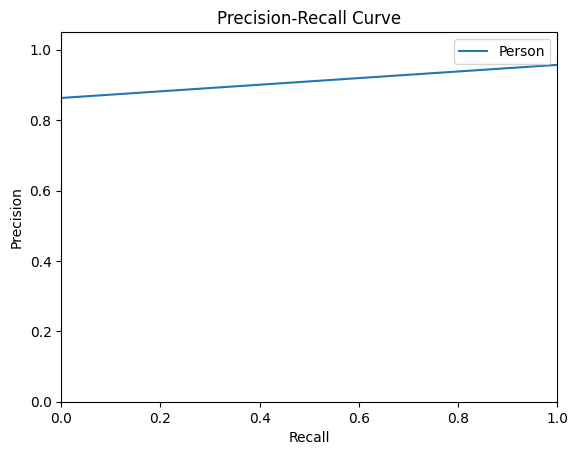

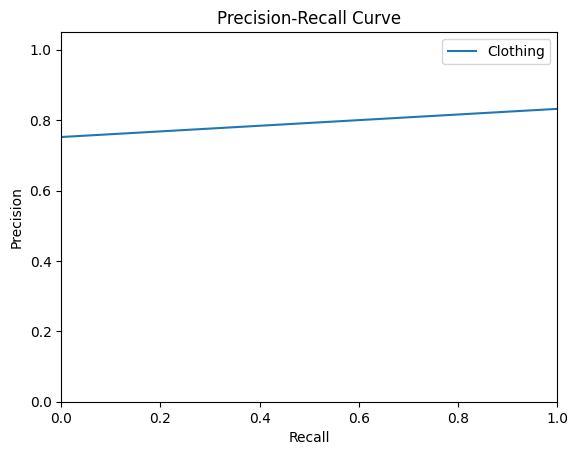

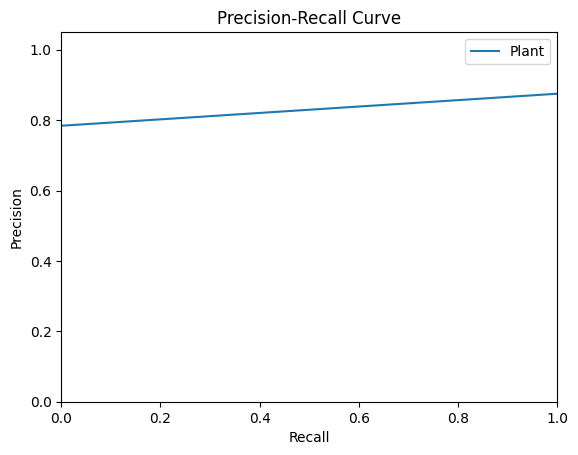

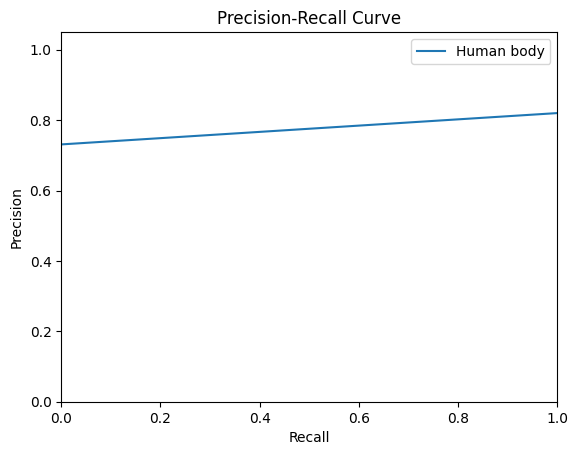

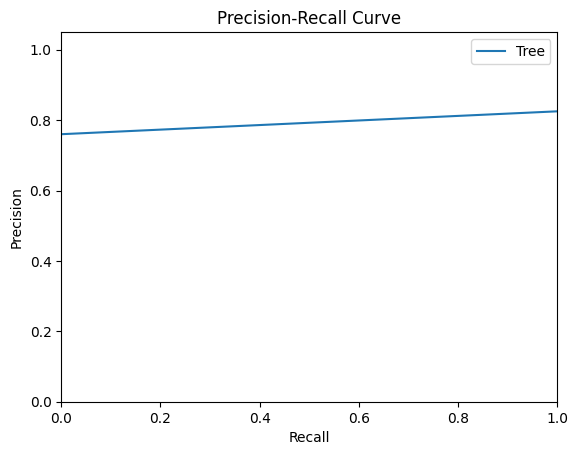

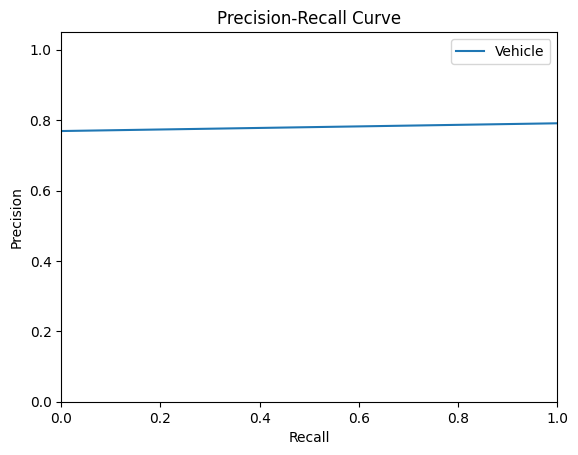

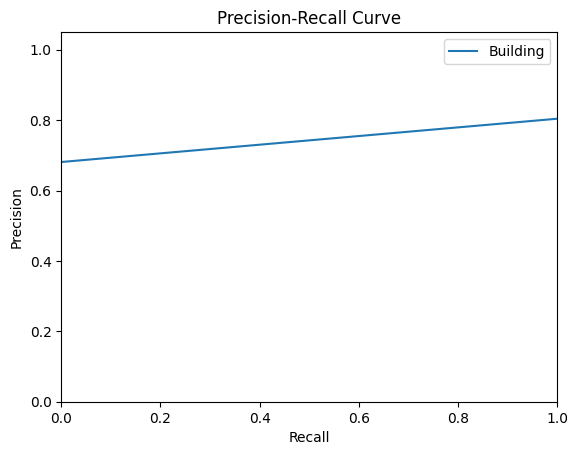

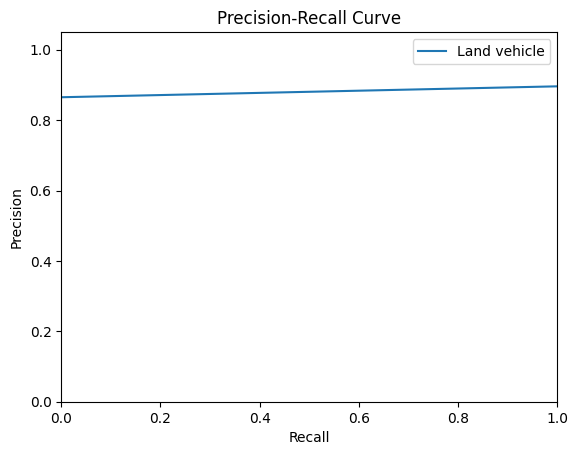

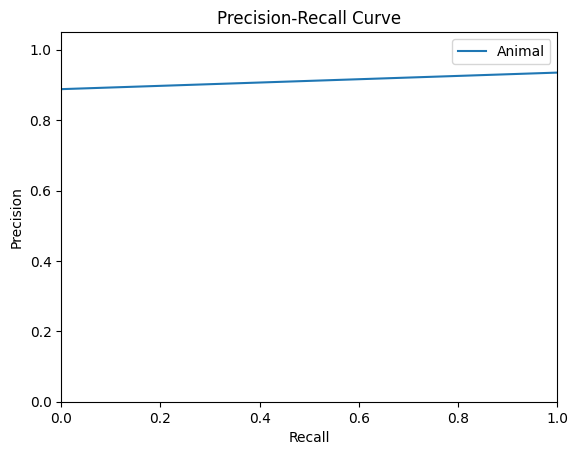

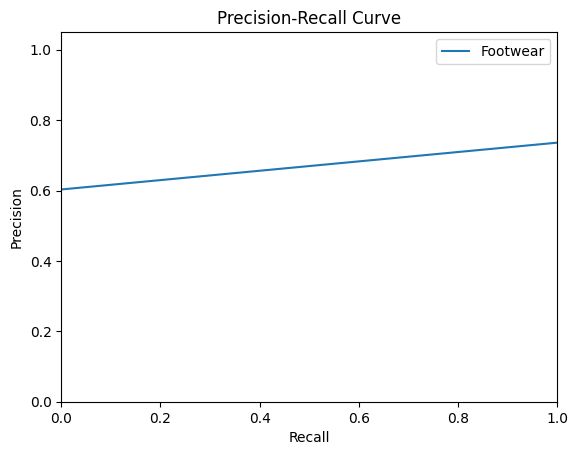

In [43]:
#import minmaxscaler
from sklearn.preprocessing import MinMaxScaler

re_pre_set_of_df = []
for cls in classes:
    df = pd.read_csv(f"./single_class_query_imgs_result/{cls}_result.csv")
    re_pre_set_of_df.append(df)

for df in re_pre_set_of_df:
    #normalize the score column
    scaler = MinMaxScaler()
    df[['Recall@1000']] = scaler.fit_transform(df[['Recall@1000']])
    df.sort_values(by=['Recall@1000'], ascending=False, inplace=True)
    print(df.head())



#draw precision recall curve with matplotlib not using sklearn
i=0
for df in re_pre_set_of_df:
    #draw precision recall curve
    plt.figure()
    plt.plot(df['Recall@1000'], df['Precision@1000'], label=classes[i])
    i += 1
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.legend()
    plt.show()



In [28]:
for df in set_of_df:
    scaler = preprocessing.MinMaxScaler()
    df[['Recall@100', 'Precision@100', 'FPR@100']] = scaler.fit_transform(df[['Recall@100', 'Precision@100', 'FPR@100']])
    print(df.head())

                ImageID  Recall@100  Precision@100   FPR@100
0  val\01ab773186c630c4    0.384615       0.384615  0.615385
1  val\057d0e3dc7e56806    0.038462       0.038462  0.961538
2  val\0709eb8e8c2d19fa    0.192308       0.192308  0.807692
3  val\105c98d1ee5f03ef    0.807692       0.807692  0.192308
4  val\11596769ce629446    0.730769       0.730769  0.269231
                ImageID  Recall@100  Precision@100   FPR@100
0  val\01ab773186c630c4    0.357143       0.357143  0.642857
1  val\022c1f420446d118    1.000000       1.000000  0.000000
2  val\0709eb8e8c2d19fa    0.571429       0.571429  0.428571
3  val\07f52dac7724e48d    0.571429       0.571429  0.428571
4  val\092f6bd6d306fdf6    0.500000       0.500000  0.500000
                ImageID  Recall@100  Precision@100   FPR@100
0  val\01408d986127ece3    0.823529       0.823529  0.176471
1  val\06fb3d0c72b5525a    0.705882       0.705882  0.294118
2  val\0ba9d2cc31b93d70    0.470588       0.470588  0.529412
3  val\111147418c6aca65 

In [33]:
for index, df in enumerate(set_of_df):
    temp_cls = classes[index]
    print(temp_cls)
    df.to_csv(f"./single_class_query_imgs_result/{temp_cls}_result_normalized.csv", index=False)

Person
Clothing
Plant
Human body
Tree
Vehicle
Building
Land vehicle
Animal
Footwear
